# 导入相关库

In [11]:
import numpy as np
from matplotlib import pyplot as plt
#%matplotlib inline

In [2]:
from sklearn import svm

In [3]:
from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input

Using TensorFlow backend.


# 读取VGG16预训练模型参数

In [4]:
model_vgg16 = VGG16(weights='imagenet', include_top=False)

# 读取训练集图片计算特征

In [8]:
training_set_vgg16_features = []
for i in list(range(1, 401)) + list(range(501, 901)):
    img_path = 'test8/%06d.png' % i
    # print(img_path)
    img = image.load_img(img_path, target_size=(224, 224))# 读取图片
    
    plt.imshow(img)
    plt.show()# 显示图片
    x = image.img_to_array(img)# 图片转换为ndarray
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)# 数组转换为vgg16输入格式

    training_set_vgg16_features.append(model_vgg16.predict(x).reshape((7*7*512, )))# 计算该张图片的特征

In [9]:
training_set_vgg16_features_ndarray = np.vstack(training_set_vgg16_features)# 转换为ndarray

In [10]:
training_set_label = np.array([1.0 if i < 400 else 0.0 for i in range(800)])

# 读取测试集图片计算特征

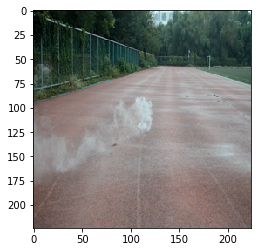

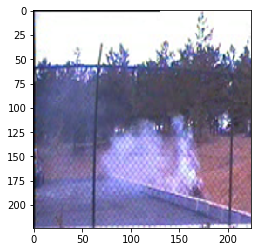

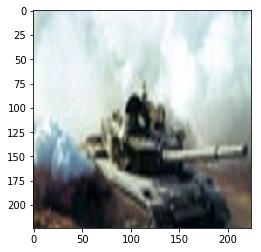

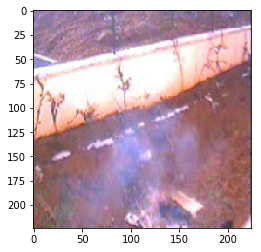

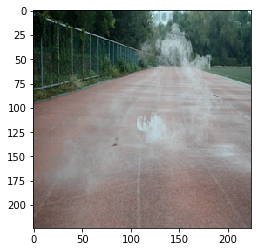

...

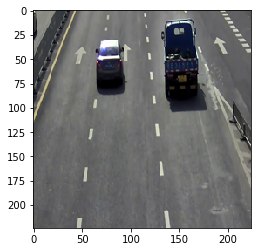

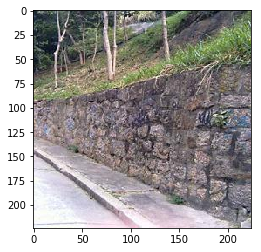

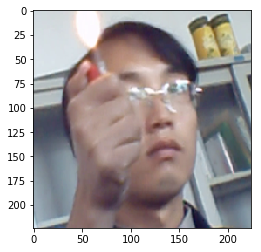

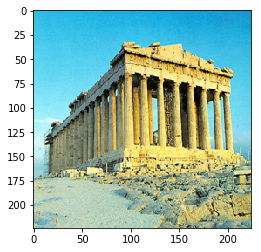

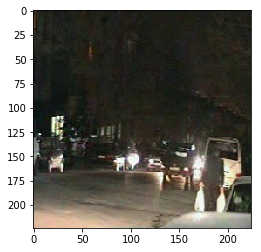

In [15]:
test_set_vgg16_features = []
for i in list(range(401, 501)) + list(range(901, 1001)):
    img_path = 'test8/%06d.png' % i
    # print(img_path)
    img = image.load_img(img_path, target_size=(224, 224))# 读取图片
    plt.imshow(img)
    plt.show()# 显示图片
    x = image.img_to_array(img)# 图片转换为ndarray
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)# 数组转换为vgg16输入格式

    test_set_vgg16_features.append(model_vgg16.predict(x).reshape((7*7*512, )))# 计算该张图片的特征

In [16]:
test_set_vgg16_features_ndarray = np.vstack(test_set_vgg16_features)# 转换为ndarray

# VGG16+SVM

### 定义SVM

In [ ]:
clf_vgg = svm.SVC()

### 训练SVM

In [ ]:
clf_vgg.fit(training_set_vgg16_features_ndarray, training_set_label)

### 计算SVM在训练集上的预测值

In [ ]:
training_set_vgg16_with_svm_prediction = clf_vgg.predict(training_set_vgg16_features_ndarray)

In [ ]:
training_set_vgg16_with_svm_prediction[training_set_vgg16_with_svm_prediction >= 0.5] = 1
training_set_vgg16_with_svm_prediction[training_set_vgg16_with_svm_prediction < 0.5] = 0

In [ ]:
training_set_vgg16_with_svm_prediction_positive = training_set_vgg16_with_svm_prediction[: 400]
training_set_vgg16_with_svm_prediction_negative = training_set_vgg16_with_svm_prediction[400:]

### 计算训练集准确率

In [ ]:
print('VGG16+SVM，训练集\n检验率： {0}, 虚警率： {1}'.format(
    len(training_set_vgg16_with_svm_prediction_positive[training_set_vgg16_with_svm_prediction_positive == 1]) / len(training_set_vgg16_with_svm_prediction_positive),
    len(training_set_vgg16_with_svm_prediction_negative[training_set_vgg16_with_svm_prediction_negative == 1]) / len(training_set_vgg16_with_svm_prediction_negative)))

### 计算SVM在测试集上的预测值

In [ ]:
test_set_vgg16_with_svm_prediction = clf_vgg.predict(test_set_vgg16_features_ndarray)

In [ ]:
test_set_vgg16_with_svm_prediction[test_set_vgg16_with_svm_prediction >= 0.5] = 1
test_set_vgg16_with_svm_prediction[test_set_vgg16_with_svm_prediction < 0.5] = 0
test_set_vgg16_with_svm_prediction_positive = test_set_vgg16_with_svm_prediction[: 100]
test_set_vgg16_with_svm_prediction_negative = test_set_vgg16_with_svm_prediction[100:]

### 计算测试集准确率

In [ ]:
print('VGG16+SVM，测试集\n检验率： {0}, 虚警率： {1}'.format(
    len(test_set_vgg16_with_svm_prediction_positive[test_set_vgg16_with_svm_prediction_positive == 1]) / len(test_set_vgg16_with_svm_prediction_positive), 
    len(test_set_vgg16_with_svm_prediction_negative[test_set_vgg16_with_svm_prediction_negative == 1]) / len(test_set_vgg16_with_svm_prediction_negative)))

# 全连接神经网络

### 导入相关库

In [ ]:
from keras.models import Sequential
from keras.layers import Activation, Dropout, Dense

### 定义全连接神经网络

In [ ]:
model_smoke_detector = Sequential()
model_smoke_detector.add(Dense(1024, activation='sigmoid', input_shape=(7*7*512, )))# 加入全连接层
model_smoke_detector.add(Dropout(0.5))# 加入dropout防止过拟合
model_smoke_detector.add(Dense(128, activation='sigmoid'))# 加入全连接层
model_smoke_detector.add(Dropout(0.5))# 加入dropout防止过拟合
model_smoke_detector.add(Dense(1, activation='sigmoid'))# 加入全连接层

In [ ]:
model_smoke_detector.compile(optimizer='rmsprop',
      loss='mean_squared_error',
      metrics=['accuracy'])
# 定义神经网络损失函数等

In [ ]:
model_smoke_detector.fit(training_set_vgg16_features_ndarray, training_set_label, nb_epoch=10, batch_size=16)
# 拟合数据即训练神经网络

In [ ]:
test_set_vgg16_with_fc_prediction = model_smoke_detector.predict(test_set_vgg16_features_ndarray)# 对测试集进行预测

In [ ]:
test_set_vgg16_with_fc_prediction[test_set_vgg16_with_fc_prediction >= 0.5] = 1
test_set_vgg16_with_fc_prediction[test_set_vgg16_with_fc_prediction < 0.5] = 0
test_set_vgg16_with_fc_prediction_positive = test_set_vgg16_with_fc_prediction[:100]
test_set_vgg16_with_fc_prediction_negative = test_set_vgg16_with_fc_prediction[100:]

In [ ]:
print('VGG16+SVM，测试集\n检验率： {0}, 虚警率： {1}'.format(
    len(test_set_vgg16_with_fc_prediction_positive[test_set_vgg16_with_fc_prediction_positive == 1]) / len(test_set_vgg16_with_fc_prediction_positive),
    len(test_set_vgg16_with_fc_prediction_negative[test_set_vgg16_with_fc_prediction_negative == 1]) / len(test_set_vgg16_with_fc_prediction_negative)))